# Funções, bibliotecas e Dataframe ficticios

In [71]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import matplotlib.font_manager as fm #para alterar as fontes dos graficos
import seaborn as sns

import pyperclip

# Definindo o estilo de fonte e tema
fonte = fm.FontProperties(family="Calibri", style="italic")

sns.set_style('whitegrid') #cor da grade(fundo)

In [72]:
# Manipulação e Tratamento de dados
import openpyxl
import pandas as pd
import numpy as np
from numpy import NaN

#ignorando Warning inuteis
import warnings 
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)
warnings.filterwarnings(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [73]:
import traceback

In [74]:
import requests

# CARREGANDO BASE
arquivo = 'fake_database'
url = "https://raw.githubusercontent.com/GabrielGabes/functions_gsa/main/" + arquivo + ".py"
print(url)
#response = requests.get(url); code = response.text; exec(code)
#df = fake_database2(2250); df_bck = df.copy(); display(df.head())

arquivo = 'funcoes_estatisticas'
url = "https://raw.githubusercontent.com/GabrielGabes/functions_gsa/main/" + arquivo + ".py"
print(url)
response = requests.get(url); code = response.text; exec(code)

# Função para avaliação de modelos exibindo metricas de avaliação
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, RocCurveDisplay
arquivo = 'ML_supervised_learning'
url = "https://raw.githubusercontent.com/GabrielGabes/functions_gsa/main/" + arquivo + ".py"
print(url); response = requests.get(url); code = response.text; exec(code)

print('TUDO OK')

https://raw.githubusercontent.com/GabrielGabes/functions_gsa/main/fake_database.py
https://raw.githubusercontent.com/GabrielGabes/functions_gsa/main/funcoes_estatisticas.py
https://raw.githubusercontent.com/GabrielGabes/functions_gsa/main/ML_supervised_learning.py
TUDO OK


In [75]:
def contribuicao_proba_tabela(df, coluna_analisada, model, sep=10):
    # Criar DataFrame para análise com a variável de interesse variando em um intervalo
    minimo, maximo = df[coluna_analisada].min(), df[coluna_analisada].max()
    df_analise_feature = pd.DataFrame()

    # Preencher as demais colunas com o valor médio
    for coluna in df.columns:
        if coluna != coluna_analisada:
            df_analise_feature[coluna] = df[coluna].mean()
        else:
            df_analise_feature[coluna] = np.linspace(minimo, maximo, sep)

    # Fazer previsão de probabilidade e adicionar ao DataFrame de análise
    df_analise_feature['predict_proba'] = model.predict_proba(df_analise_feature)[:, 1]

    # Retornar apenas a coluna analisada e a probabilidade prevista
    return df_analise_feature[[coluna_analisada, 'predict_proba']]

#x_data = pd.DataFrame(x_teste, columns=df.columns[:-1])
#resultado = contribuicao_proba_tabela(x_data, 'feature_4', modelo_m1, sep=10)
#resultado

def contribuicao_proba_grafico(resultado, coluna):
    cmap = plt.get_cmap('viridis')
    norm = plt.Normalize(resultado['predict_proba'].min(), resultado['predict_proba'].max())
    colors = cmap(norm(resultado['predict_proba']))

    ax = sns.lineplot(x=resultado[coluna].round(1), y=resultado['predict_proba'])

#plt.figure(figsize=(4,3))
#contribuicao_proba_grafico(resultado, 'feature_4')
#plt.show()

def contribuicao_proba(x_data, modelo, sep=10):
    for i, coluna_analisada in enumerate(x_data.columns, 1):
        plt.subplot(10, 3, i)
        resultado = contribuicao_proba_tabela(x_data, coluna_analisada, modelo, sep=sep)
        contribuicao_proba_grafico(resultado, coluna_analisada)


from sklearn.inspection import PartialDependenceDisplay
def contribuicao_proba2(x_data, modelo):
    # Definir o tamanho da figura geral
    fig, axes = plt.subplots(len(x_data.columns)//3+1, 3, figsize=(10, 10))
    axes = axes.ravel()  # Transformar a matriz de eixos em uma lista para fácil iteração

    # Iterar pelas colunas e gerar gráficos de dependência parcial
    for i, column in enumerate(x_data.columns):
        PartialDependenceDisplay.from_estimator(modelo, x_data, [column], ax=axes[i])

    # Ajustar o layout para evitar sobreposição
    plt.tight_layout()
    plt.show()

# Criando dataframe sintetico desbalanceado

In [76]:
from sklearn.datasets import make_classification

# Gerar dados sintéticos desbalanceados
x, y = make_classification(n_samples=7346, 
                           n_features=10, # qtd total de features
                           n_informative=6, # features realmente uteis para o modelo
                           n_redundant=3, # features que diz praticamente oque uma outra já fim
                           n_classes=2, 
                           n_clusters_per_class=3,  # Subgrupos
                           weights=[0.95, 0.05], 
                           class_sep=0.125,
                           random_state=3141592)

# Criar um DataFrame
df = pd.DataFrame(x, columns=[f'feature_{i}' for i in range(x.shape[1])])
df['target'] = y

# Ver a distribuição de classes
print(df['target'].value_counts(normalize=True))
print(df['target'].value_counts())

display(pd.concat([df.head(5), df.tail(5)]).T)
# Salvar para análise
#df.to_csv('imbalanced_dataset.csv', index=False)


target
0    0.945685
1    0.054315
Name: proportion, dtype: float64
target
0    6947
1     399
Name: count, dtype: int64


,0,1,2,3,4,7341,7342,7343,7344,7345
feature_0,-1.043680,0.024369,0.615455,-0.085438,-1.950661,-0.517000,-2.692529,-1.076198,-0.173833,0.051514
feature_1,-1.990359,1.052022,-0.135408,-0.087211,-0.684208,0.062871,-2.081917,-0.133125,-0.621593,1.548708
feature_2,-1.616674,0.669025,5.117934,1.508050,-2.998303,0.752382,-0.332134,0.717059,0.298679,-1.236423
feature_3,0.514712,-1.276948,-3.700463,-1.036884,1.793797,0.061186,0.162031,0.102429,-2.520496,3.029865
feature_4,-0.294449,-0.629200,-3.071781,-0.348713,0.138640,0.112934,-4.167281,-3.733083,0.181639,2.231804
feature_5,-0.168076,-0.723463,-0.870718,1.042102,0.215236,1.553327,-1.498722,-2.430186,0.422883,0.434388
feature_6,-0.737200,1.141347,0.541557,1.173786,-0.266201,0.655819,0.044746,-0.410455,2.391613,-4.436130
feature_7,2.205685,-2.237312,0.961470,-0.504714,-1.607260,-1.007727,-2.162316,-2.942299,0.249525,1.747591
feature_8,-0.822867,2.075696,1.130719,-0.408578,-0.450379,-1.329416,0.797892,1.209964,-0.867040,-2.973186
feature_9,-2.207886,0.502049,-2.539167,0.283530,0.112774,1.045324,-3.580595,-2.117530,-0.597481,1.975224


# Tratando o DataFrame

In [77]:
# Variavel Dependente
var_dep = 'target'
y = df[var_dep]
display(y.head())

x = df.drop(var_dep, axis=1)

0    0
1    1
2    0
3    1
4    0
Name: target, dtype: int32

In [78]:
# DUMMYRIZAÇÃO
colunas_categoricas = []
colunas_binarias = []
colunas_mais3_categorias = []

for coluna in x.columns:
    if df[coluna].dtype == 'O':
        categorias = x[coluna].unique()
        if len(categorias) == 2:
            print('2 niveis:', coluna, '=>', categorias)
            colunas_categoricas.append(coluna)
            colunas_binarias.append(coluna)
        else:
            print('3 niveis:', coluna, '=>', categorias)
            colunas_categoricas.append(coluna)
            colunas_mais3_categorias.append(coluna)

############################################################################################
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder #transformando colunas com 2 categorias em 0 e 1

coluna = x.columns
one_hot = make_column_transformer((
    OneHotEncoder(drop='if_binary'), #caso a coluna tenha apenas 2 categorias 
    colunas_categoricas), #passando quais são essas colunas
    remainder = 'passthrough', sparse_threshold=0) #oque deve ser feito com as outras

#Aplicando transformação
x = one_hot.fit_transform(x)

#Os novos nomes das colunas #'onehotencoder=transformadas; 'remainder'=não transformadas
novos_nomes_colunas = one_hot.get_feature_names_out(coluna)

# Remover prefixo 'remainder__' das colunas que não foram transformadas
#novos_nomes_colunas = [nome.replace('remainder__', '') for nome in novos_nomes_colunas]

x = pd.DataFrame(x, columns = novos_nomes_colunas) #alterando de volta
x_columns = x.columns.tolist() 

############################################################################################
# Normalização (scaling entre 0 e 1) com MinMaxScaler ******************************
from sklearn.preprocessing import MinMaxScaler
normalizacao = MinMaxScaler()
#x = normalizacao.fit_transform(x)
# df['Close_normalizada'] = (df[coluna] - df[coluna].min()) / (df[coluna].max() - df[coluna].min())

# Padronização (média 0 e desvio padrão 1) com StandardScaler **********************
from sklearn.preprocessing import StandardScaler
padronizacao = StandardScaler()
#x = padronizacao.fit_transform(x)
# df['Close_padronizada'] = (df[coluna] - df[coluna].mean()) / df[coluna].std()

############################################################################################
# DEFININDO A VARIAVEL DEPENDENTE
from sklearn.preprocessing import LabelEncoder
y = LabelEncoder().fit_transform(y)

############################################################################################
#backups
x_inteiro = x
y_inteiro = y

# DIVIDINDO BASE EM TREINO E TESTE
from sklearn.model_selection import train_test_split
x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, 
                                                    stratify = y, #para manter a proporção da Var Dep nos splits
                                                    random_state = 5) #raiz da aleatoridade
# test_size = 0.25 #porcentagem que ira ser separado para testes

print(x_treino.shape, x_teste.shape)
print(y_treino.shape, y_teste.shape)

(5509, 10) (1837, 10)
(5509,) (1837,)


In [79]:
print(pd.Series(y_treino).value_counts())
print(pd.Series(y_teste).value_counts())

0    5210
1     299
Name: count, dtype: int64
0    1737
1     100
Name: count, dtype: int64


# Instanciando modelos

In [80]:
sem_random = 3141592

from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import (RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier,
                              BaggingClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier, HistGradientBoostingClassifier)
from xgboost import XGBClassifier, XGBRFClassifier, XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier


# Definir a semente aleatória
sem_random = 3141592

# Criar dicionário com todos os modelos
model_dict = {
    # Modelos Baseados em Árvores
    'DecisionTreeClassifier': DecisionTreeClassifier(random_state=sem_random),
    'ExtraTreeClassifier': ExtraTreeClassifier(random_state=sem_random),
    'RandomForestClassifier': RandomForestClassifier(random_state=sem_random),
    'ExtraTreesClassifier': ExtraTreesClassifier(random_state=sem_random),
    'BaggingClassifier': BaggingClassifier(random_state=sem_random),
    
    # Modelos de Boosting
    'AdaBoostClassifier': AdaBoostClassifier(random_state=sem_random),
    'GradientBoostingClassifier': GradientBoostingClassifier(random_state=sem_random),
    'HistGradientBoostingClassifier': HistGradientBoostingClassifier(random_state=sem_random),
    'XGBClassifier': XGBClassifier(random_state=sem_random),
    'XGBRFClassifier':XGBRFClassifier(random_state=sem_random), 
    'LGBMClassifier': LGBMClassifier(random_state=sem_random),
    'CatBoostClassifier': CatBoostClassifier(verbose=0)
}

#for model_name in model_dict:
#    print(model_name, '->', model_dict[model_name])

model_dict_smote = {
    # Modelos Baseados em Árvores
    'DecisionTreeClassifier': DecisionTreeClassifier(random_state=sem_random),
    'ExtraTreeClassifier': ExtraTreeClassifier(random_state=sem_random),
    'RandomForestClassifier': RandomForestClassifier(random_state=sem_random),
    'ExtraTreesClassifier': ExtraTreesClassifier(random_state=sem_random),
    'BaggingClassifier': BaggingClassifier(random_state=sem_random),
    
    # Modelos de Boosting
    'AdaBoostClassifier': AdaBoostClassifier(random_state=sem_random),
    'GradientBoostingClassifier': GradientBoostingClassifier(random_state=sem_random),
    'HistGradientBoostingClassifier': HistGradientBoostingClassifier(random_state=sem_random),
    'XGBClassifier': XGBClassifier(random_state=sem_random),
    'XGBRFClassifier':XGBRFClassifier(random_state=sem_random), 
    'LGBMClassifier': LGBMClassifier(random_state=sem_random),
    'CatBoostClassifier': CatBoostClassifier(verbose=0)
}

#for model_name in model_dict:
#    print(model_name, '->', model_dict[model_name])

# Dados sinteticos SMOTE

In [132]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from sklearn.utils import resample

##################################################################################
# BALANCEAMENTO DE DADOS - OVERSAMPLING
from imblearn.over_sampling import SMOTE

# criando dados sintéticos
oversample = SMOTE() 
x_treino_balanceado, y_treino_balanceado = oversample.fit_resample(x_treino, y_treino)

# checkando
print("OVERSAMPLING - SMOTE")
print(pd.concat([pd.Series(y_treino_balanceado).value_counts(), pd.Series(y_treino_balanceado).value_counts(normalize=True)], axis=1))
##################################################################################

# BALANCEAMENTO DE DADOS - UNDERSAMPLING - NEARMISS
from imblearn.under_sampling import NearMiss

# reduzindo classe
undersample = NearMiss(version=3)
x_balanceado, y_balanceado = undersample.fit_resample(x_treino, y_treino)

# checkando
print("\nUNDERSAMPLING - NearMiss")
print(pd.concat([pd.Series(y_balanceado).value_counts(), pd.Series(y_balanceado).value_counts(normalize=True)], axis=1))
##################################################################################

# BALANCEAMENTO DE DADOS - UPSAMPLING
# Usando a técnica de `upsample` diretamente do `sklearn.utils.resample`
# Aumenta o número de exemplos da classe minoritária até balancear com a classe majoritária

# Separando as classes
x_treino_maj = x_treino[y_treino == 0]
x_treino_min = x_treino[y_treino == 1]

y_treino_maj = y_treino[y_treino == 0]
y_treino_min = y_treino[y_treino == 1]

# Aumentando os dados da classe minoritária (upsample)
x_treino_min_upsampled, y_treino_min_upsampled = resample(
    x_treino_min, y_treino_min, 
    replace=True,          # permite repetição de amostras
    n_samples=len(x_treino_maj),  # iguala ao número da classe majoritária
    random_state=42        # para reprodutibilidade
)

# Combinando a classe majoritária com os dados upsampled da classe minoritária
x_treino_balanceado = pd.concat([x_treino_maj, x_treino_min_upsampled])
y_treino_balanceado = np.concatenate((y_treino_maj, y_treino_min_upsampled))

# checkando
print("\nUPSAMPLING")
print(pd.concat([pd.Series(y_treino_balanceado).value_counts(), pd.Series(y_treino_balanceado).value_counts(normalize=True)], axis=1))
##################################################################################

# BALANCEAMENTO DE DADOS - DOWNSAMPLING
# Reduz o número de exemplos da classe majoritária para igualar ao da classe minoritária

# Reduzindo a classe majoritária (downsample)
x_treino_maj_downsampled, y_treino_maj_downsampled = resample(
    x_treino_maj, y_treino_maj, 
    replace=False,         # sem repetição de amostras
    n_samples=len(x_treino_min),  # iguala ao número da classe minoritária
    random_state=42        # para reprodutibilidade
)

# Combinando a classe minoritária com os dados downsampled da classe majoritária
x_treino_balanceado = pd.concat([x_treino_maj_downsampled, x_treino_min])
y_treino_balanceado = np.concatenate((y_treino_maj_downsampled, y_treino_min))

# checkando
print("\nDOWNSAMPLING")
print(pd.concat([pd.Series(y_treino_balanceado).value_counts(), pd.Series(y_treino_balanceado).value_counts(normalize=True)], axis=1))
##################################################################################


OVERSAMPLING - SMOTE
   count  proportion
0   5210         0.5
1   5210         0.5

UNDERSAMPLING - NearMiss
   count  proportion
0    299         0.5
1    299         0.5

UPSAMPLING
   count  proportion
0   5210         0.5
1   5210         0.5

DOWNSAMPLING
   count  proportion
0    299         0.5
1    299         0.5


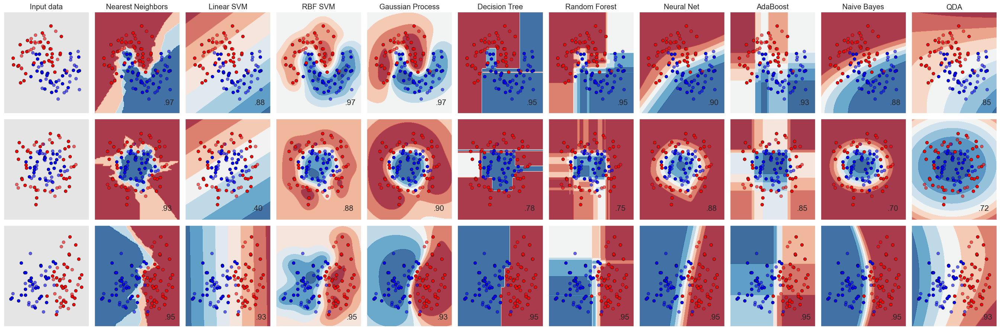

In [133]:
# Code source: Gaël Varoquaux
#              Andreas Müller
# Modified for documentation by Jaques Grobler
# License: BSD 3 clause

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap

from sklearn.datasets import make_circles, make_classification, make_moons
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

names = [
    "Nearest Neighbors",
    "Linear SVM",
    "RBF SVM",
    "Gaussian Process",
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "Naive Bayes",
    "QDA",
]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025, random_state=42),
    SVC(gamma=2, C=1, random_state=42),
    GaussianProcessClassifier(1.0 * RBF(1.0), random_state=42),
    DecisionTreeClassifier(max_depth=5, random_state=42),
    RandomForestClassifier(
        max_depth=5, n_estimators=10, max_features=1, random_state=42
    ),
    MLPClassifier(alpha=1, max_iter=1000, random_state=42),
    AdaBoostClassifier(algorithm="SAMME", random_state=42),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
]

X, y = make_classification(
    n_features=2, n_redundant=0, n_informative=2, random_state=1, n_clusters_per_class=1
)
rng = np.random.RandomState(2)
X += 2 * rng.uniform(size=X.shape)
linearly_separable = (X, y)

datasets = [
    make_moons(noise=0.3, random_state=0),
    make_circles(noise=0.2, factor=0.5, random_state=1),
    linearly_separable,
]

figure = plt.figure(figsize=(27, 9))
i = 1
# iterate over datasets
for ds_cnt, ds in enumerate(datasets):
    # preprocess dataset, split into training and test part
    X, y = ds
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.4, random_state=42
    )

    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5

    # just plot the dataset first
    cm = plt.cm.RdBu
    cm_bright = ListedColormap(["#FF0000", "#0000FF"])
    ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
    if ds_cnt == 0:
        ax.set_title("Input data")
    # Plot the training points
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors="k")
    # Plot the testing points
    ax.scatter(
        X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6, edgecolors="k"
    )
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xticks(())
    ax.set_yticks(())
    i += 1

    # iterate over classifiers
    for name, clf in zip(names, classifiers):
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)

        clf = make_pipeline(StandardScaler(), clf)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)
        DecisionBoundaryDisplay.from_estimator(
            clf, X, cmap=cm, alpha=0.8, ax=ax, eps=0.5
        )

        # Plot the training points
        ax.scatter(
            X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, edgecolors="k"
        )
        # Plot the testing points
        ax.scatter(
            X_test[:, 0],
            X_test[:, 1],
            c=y_test,
            cmap=cm_bright,
            edgecolors="k",
            alpha=0.6,
        )

        ax.set_xlim(x_min, x_max)
        ax.set_ylim(y_min, y_max)
        ax.set_xticks(())
        ax.set_yticks(())
        if ds_cnt == 0:
            ax.set_title(name)
        ax.text(
            x_max - 0.3,
            y_min + 0.3,
            ("%.2f" % score).lstrip("0"),
            size=15,
            horizontalalignment="right",
        )
        i += 1

plt.tight_layout()
plt.show()

# Treinando modelos

In [82]:
model_dict.items()

dict_items([('DecisionTreeClassifier', DecisionTreeClassifier(random_state=3141592)), ('ExtraTreeClassifier', ExtraTreeClassifier(random_state=3141592)), ('RandomForestClassifier', RandomForestClassifier(random_state=3141592)), ('ExtraTreesClassifier', ExtraTreesClassifier(random_state=3141592)), ('BaggingClassifier', BaggingClassifier(random_state=3141592)), ('AdaBoostClassifier', AdaBoostClassifier(random_state=3141592)), ('GradientBoostingClassifier', GradientBoostingClassifier(random_state=3141592)), ('HistGradientBoostingClassifier', HistGradientBoostingClassifier(random_state=3141592)), ('XGBClassifier', XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=

In [83]:
import time

print('*'*30, 'NORMAL', '*'*30)
# Treinando todos os modelos
tab_modelo_treinados = pd.DataFrame(columns=['Modelo', 'Status', 'Tempo'])
for model_name, model_instance in model_dict.items():
    # print(model_name)
    try:
        start_time = time.time()
        model_instance.fit(x_treino, y_treino)
        end_time = time.time()
        training_time = end_time - start_time
        tab_modelo_treinados.loc[len(tab_modelo_treinados)] = [model_name, 'OK', training_time]
    except Exception as e:
        tab_modelo_treinados.loc[len(tab_modelo_treinados)] = [model_name, 'Erro', np.nan]
        #del model_dict[model_name] # excluindo do dicionario # não pode modificar o dicionario durante iteracao

print('*'*30, 'SMOTE', '*'*30)
# Treinando todos os modelos com dados balanceados (SMOTE)
tab_modelo_smote_treinados = pd.DataFrame(columns=['Modelo', 'Status', 'Tempo'])
for model_name, model_instance in model_dict_smote.items():
    # print(model_name)
    try:
        start_time = time.time()
        model_instance.fit(x_treino_balanceado, y_treino_balanceado)
        end_time = time.time()
        training_time = end_time - start_time
        tab_modelo_smote_treinados.loc[len(tab_modelo_smote_treinados)] = [model_name, 'OK', training_time]
    except Exception as e:
        tab_modelo_smote_treinados.loc[len(tab_modelo_smote_treinados)] = [model_name, 'Erro', np.nan]
        #del model_dict_smote[model_name] # excluindo do dicionario # não pode modificar o dicionario durante iteracao

print('*'*30, 'FIM', '*'*30)

display(tab_modelo_treinados)
display(tab_modelo_smote_treinados)

****************************** NORMAL ******************************
[LightGBM] [Info] Number of positive: 299, number of negative: 5210
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000164 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 5509, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.054275 -> initscore=-2.857892
[LightGBM] [Info] Start training from score -2.857892
****************************** SMOTE ******************************
[LightGBM] [Info] Number of positive: 5210, number of negative: 5210
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2550
[LightGBM] [Info] Number of data points in the train set: 10420, number of used features: 10
[LightGBM] [Inf

,Modelo,Status,Tempo
0,DecisionTreeClassifier,OK,0.120840
1,ExtraTreeClassifier,OK,0.004522
2,RandomForestClassifier,OK,1.713338
3,ExtraTreesClassifier,OK,0.308437
4,BaggingClassifier,OK,0.527270
5,AdaBoostClassifier,OK,0.512107
6,GradientBoostingClassifier,OK,1.975090
7,HistGradientBoostingClassifier,OK,0.241260
8,XGBClassifier,OK,0.119262
9,XGBRFClassifier,OK,0.081689


,Modelo,Status,Tempo
0,DecisionTreeClassifier,OK,0.138280
1,ExtraTreeClassifier,OK,0.007435
2,RandomForestClassifier,OK,2.958829
3,ExtraTreesClassifier,OK,0.702388
4,BaggingClassifier,OK,0.959970
5,AdaBoostClassifier,OK,0.803061
6,GradientBoostingClassifier,OK,3.572000
7,HistGradientBoostingClassifier,OK,0.323185
8,XGBClassifier,OK,0.132786
9,XGBRFClassifier,OK,0.141797


# Analisando as probabilidades geradas pelos modelos

In [84]:
def adicionar_previsoes(x_teste, y_teste, **modelos):
    # Inicializa o DataFrame com a coluna `y`
    df = pd.DataFrame({'y': y_teste})

    # Para cada modelo, gera previsões e adiciona ao DataFrame
    for nome, modelo in modelos.items():
        try:
        #if hasattr(modelo, "predict_proba"):
            df[nome] = modelo.predict_proba(x_teste)[:, 1] * 100
        except:
            print('erro:', nome)

    return df

previsoes_normal = adicionar_previsoes(x_teste, y_teste, **model_dict)
previsoes_normal['tipo'] = 'normal'
previsoes_smote = adicionar_previsoes(x_teste, y_teste, **model_dict_smote)
previsoes_smote['tipo'] = 'smote'

previsoes = pd.concat([previsoes_normal, previsoes_smote])
previsoes = previsoes.reset_index(drop=True)

previsoes.sample(10)

,y,DecisionTreeClassifier,ExtraTreeClassifier,RandomForestClassifier,ExtraTreesClassifier,BaggingClassifier,AdaBoostClassifier,GradientBoostingClassifier,HistGradientBoostingClassifier,XGBClassifier,XGBRFClassifier,LGBMClassifier,CatBoostClassifier,tipo
2619,0,100.0,100.0,62.0,45.0,40.0,50.686828,72.248981,60.895773,51.891594,61.673100,56.505917,60.633317,smote
2410,0,0.0,0.0,30.0,21.0,70.0,49.568884,27.924457,13.783453,1.127004,34.472015,8.384657,6.205338,smote
3568,0,100.0,100.0,12.0,12.0,30.0,49.658525,19.466052,2.444741,0.218055,40.098320,2.701313,2.214836,smote
933,0,0.0,0.0,7.0,7.0,0.0,48.576991,15.705664,6.858973,4.687346,7.399351,18.318557,5.853698,normal
968,0,0.0,0.0,0.0,0.0,0.0,46.659284,0.764757,0.036046,0.034854,5.556096,0.060179,0.082298,normal
3103,1,100.0,100.0,51.0,60.0,40.0,50.698533,82.364293,56.286797,49.532162,80.270859,83.781185,79.094779,smote
2240,0,0.0,0.0,3.0,3.0,0.0,48.383909,7.325874,2.329714,0.271771,15.738676,2.242083,0.629751,smote
775,0,0.0,0.0,3.0,2.0,0.0,48.031067,3.142182,1.248195,0.485491,6.495000,0.778168,5.008289,normal
2513,0,0.0,0.0,41.0,47.0,30.0,49.668758,46.615344,61.047140,83.692909,43.563908,48.462568,54.039119,smote
2889,0,0.0,100.0,8.0,7.0,0.0,49.798579,15.407478,11.421022,0.983601,17.279696,6.188541,2.266771,smote


In [85]:
colunas = list(previsoes.columns)
colunas.remove('y')
px.box(previsoes, y=colunas, color="y", facet_row="tipo")

In [86]:
outliers_df = pd.DataFrame(columns=['Coluna', 'Grupo_y', 'Grupo_tipo', 'Quantidade de Outliers'])

# Iterar pelos grupos definidos pelas colunas 'y' e 'tipo'
for (y_value, tipo_value), group in previsoes.groupby(['y', 'tipo']):
    # Iterar sobre cada coluna (exceto 'y' e 'tipo') e calcular o número de outliers para cada grupo
    for coluna in group.columns:
        if coluna not in ['y', 'tipo']:
            # Calcular os quartis e o intervalo interquartil (IQR)
            Q1 = group[coluna].quantile(0.25)
            Q3 = group[coluna].quantile(0.75)
            IQR = Q3 - Q1

            # Definir limites inferiores e superiores para detectar outliers
            limite_inferior = Q1 - 1.5 * IQR
            limite_superior = Q3 + 1.5 * IQR

            # Contar quantos valores estão fora dos limites definidos
            outliers_count = group[(group[coluna] < limite_inferior) | (group[coluna] > limite_superior)].shape[0]

            # Adicionar a contagem de outliers ao DataFrame final
            outliers_df.loc[len(outliers_df)] = [coluna, y_value, tipo_value, outliers_count]

# Exibir o DataFrame de outliers
#display(outliers_df)

px.bar(outliers_df, 
       x='Coluna', 
       y='Quantidade de Outliers', 
       facet_row='Grupo_tipo',
       facet_col='Grupo_y', 
       text='Quantidade de Outliers')

In [87]:
lista_modelos = list(previsoes.columns)
lista_modelos.remove('y'); lista_modelos.remove('tipo')
lista_modelos

fd = pd.DataFrame(columns=['modelo', 'tipo', 'threshold', 'tn', 'fp', 'fn', 'tp'])

for modelo in lista_modelos:
    fdzinho = aval_modelo_corte_tabela(y_teste, np.array(previsoes_normal[modelo]))
    fdzinho['modelo'] = modelo
    fdzinho['tipo'] = 'normal'

    fdzinho_smote = aval_modelo_corte_tabela(y_teste, np.array(previsoes_smote[modelo]))
    fdzinho_smote['modelo'] = modelo
    fdzinho_smote['tipo'] = 'smote'
    fd = pd.concat([fd, fdzinho, fdzinho_smote])

# Substituir valores NaN por 0
#fd.fillna(0, inplace=True)
fd = fd.reset_index(drop=True)
######################################################################################

# Inicializar as colunas das métricas com NaN
metricas_de_aval = ['acuracia', 'precisao', 'sensibilidade', 'especificidade', 'f1',
                    'valor_pre_posi', 'valor_pre_neg', 'taxa_falsos_positivos', 'taxa_falsos_negativos',
                    'fdr', 'fo_r', 'indice_youden', 'coef_matthews', 'fb_score']
fd[metricas_de_aval] = fd[metricas_de_aval].round(3)
colunas_uteis = ['modelo', 'tipo',
                 'threshold', 
                 'tn', 'fp', 'fn', 'tp', 
                 'precisao', 'sensibilidade', 
                 'f1', 'fb_score']
fd = fd[colunas_uteis]

custo_fp = 3.33
custo_fn = 10
fd['custo_total'] = fd['fp']*custo_fp + fd['fn']*custo_fn

fd = fd.sort_values(by='fb_score', ascending=False)
#fd = fd.sort_values(by='custo_total', ascending=True)
#print(fd['modelo'].unique()[:6])
fd.head(20)

,modelo,tipo,threshold,tn,fp,fn,tp,precisao,sensibilidade,f1,fb_score,custo_total
42,RandomForestClassifier,normal,20,1698,39,59,41,0.512,0.41,0.456,0.437,719.87
62,ExtraTreesClassifier,normal,20,1700,37,62,38,0.507,0.38,0.434,0.412,743.21
161,XGBClassifier,normal,10,1697,40,62,38,0.487,0.38,0.427,0.408,753.2
201,LGBMClassifier,normal,10,1678,59,60,40,0.404,0.40,0.402,0.401,796.47
216,LGBMClassifier,smote,60,1654,83,57,43,0.341,0.43,0.381,0.398,846.39
181,XGBRFClassifier,normal,10,1624,113,53,47,0.294,0.47,0.362,0.397,906.29
215,LGBMClassifier,smote,50,1615,122,52,48,0.282,0.48,0.356,0.395,926.26
221,CatBoostClassifier,normal,10,1644,93,56,44,0.321,0.44,0.371,0.395,869.69
61,ExtraTreesClassifier,normal,10,1511,226,38,62,0.215,0.62,0.320,0.393,1132.58
142,HistGradientBoostingClassifier,normal,20,1717,20,67,33,0.623,0.33,0.431,0.386,736.6


In [88]:
fd['threshold'] = fd['threshold'].astype('int')

In [89]:
fig = px.scatter(fd, x='fb_score', y='custo_total', color='tipo', symbol='threshold',
                 hover_data=['precisao', 'sensibilidade', 'modelo'])
fig.show()

fig = px.scatter(fd, x='fb_score', y='custo_total', color='threshold', facet_row='tipo',
                 hover_data=['precisao', 'sensibilidade', 'modelo'])
fig.show()

# selecionando apenas os 6 melhores

In [90]:
print(list(fd['modelo'][fd['tipo'] == 'normal'].unique()[:6]))
print(list(fd['modelo'][fd['tipo'] == 'smote'].unique()[:3]))

['RandomForestClassifier', 'ExtraTreesClassifier', 'XGBClassifier', 'LGBMClassifier', 'XGBRFClassifier', 'CatBoostClassifier']
['LGBMClassifier', 'CatBoostClassifier', 'ExtraTreesClassifier']


In [91]:
qtd_de_modelos = 6
qtd_de_modelos_smote = 3

###################################################################################################
indice = np.random.randint(0, len(previsoes_normal)-6, size=1)[0]

###################################################################################################
modelos_escolhidos_normal = list(fd['modelo'][fd['tipo'] == 'normal'].unique()[:qtd_de_modelos])
#modelos_escolhidos_normal.append('y')
previsoes_normal_temp = previsoes_normal[modelos_escolhidos_normal]

lista_modelos_normal = list(previsoes_normal_temp.columns)
#lista_modelos_normal.remove('y')
display(previsoes_normal_temp.loc[indice: indice+5])

###################################################################################################
modelos_escolhidos_smote = list(fd['modelo'][fd['tipo'] == 'smote'].unique()[:qtd_de_modelos_smote])
#modelos_escolhidos_smote.append('y')
previsoes_smote_temp = previsoes_smote[modelos_escolhidos_smote]

nome_da_colunas_smote = list(fd['modelo'][fd['tipo'] == 'smote'].unique()[:qtd_de_modelos_smote])
nome_da_colunas_smote = [item + '_smote' for item in modelos_escolhidos_smote]
#nome_da_colunas_smote[len(nome_da_colunas_smote)-1] = 'y'
previsoes_smote_temp.columns = nome_da_colunas_smote

lista_modelos_smote = list(previsoes_smote_temp.columns)
#lista_modelos_smote.remove('y')
display(previsoes_smote_temp.loc[indice: indice+5])

###################################################################################################
previsoes = pd.concat([previsoes_normal_temp, previsoes_smote_temp, pd.DataFrame({'y':y_teste})], axis=1)
display(previsoes.loc[indice: indice+5])

lista_modelos = list(previsoes.columns)
lista_modelos.remove('y')

,RandomForestClassifier,ExtraTreesClassifier,XGBClassifier,LGBMClassifier,XGBRFClassifier,CatBoostClassifier
1361,6.0,1.0,0.163100,0.824542,7.291971,1.490891
1362,17.0,9.0,0.231918,1.272294,16.111195,3.159695
1363,0.0,2.0,0.157103,0.395230,6.371848,0.969685
1364,10.0,12.0,3.202186,2.674822,10.485776,13.624885
1365,7.0,10.0,0.571022,0.994411,6.200462,3.279584
1366,0.0,0.0,0.057175,0.295982,5.687119,0.727947


,LGBMClassifier_smote,CatBoostClassifier_smote,ExtraTreesClassifier_smote
1361,7.392158,1.079004,8.0
1362,31.305868,23.081745,20.0
1363,3.791463,5.293949,7.0
1364,49.805859,67.661337,31.0
1365,11.241878,15.146734,38.0
1366,1.501551,1.028756,3.0


,RandomForestClassifier,ExtraTreesClassifier,XGBClassifier,LGBMClassifier,XGBRFClassifier,CatBoostClassifier,LGBMClassifier_smote,CatBoostClassifier_smote,ExtraTreesClassifier_smote,y
1361,6.0,1.0,0.163100,0.824542,7.291971,1.490891,7.392158,1.079004,8.0,0
1362,17.0,9.0,0.231918,1.272294,16.111195,3.159695,31.305868,23.081745,20.0,0
1363,0.0,2.0,0.157103,0.395230,6.371848,0.969685,3.791463,5.293949,7.0,0
1364,10.0,12.0,3.202186,2.674822,10.485776,13.624885,49.805859,67.661337,31.0,0
1365,7.0,10.0,0.571022,0.994411,6.200462,3.279584,11.241878,15.146734,38.0,0
1366,0.0,0.0,0.057175,0.295982,5.687119,0.727947,1.501551,1.028756,3.0,0


In [92]:
outliers_df = pd.DataFrame(columns=['Coluna', 'Grupo', 'Quantidade de Outliers'])

for y_value, group in previsoes.groupby('y'):
    for coluna in group.columns:
        if coluna != 'y':
            Q1 = group[coluna].quantile(0.25)
            Q3 = group[coluna].quantile(0.75)
            IQR = Q3 - Q1

            limite_inferior = Q1 - 1.5 * IQR
            limite_superior = Q3 + 1.5 * IQR

            outliers_count = group[(group[coluna] < limite_inferior) | (group[coluna] > limite_superior)].shape[0]

            outliers_df.loc[len(outliers_df)] = [coluna, y_value, outliers_count]

#display(outliers_df)

px.bar(outliers_df, 
       x='Coluna', 
       y='Quantidade de Outliers', 
       facet_col='Grupo', 
       text='Quantidade de Outliers')

# Gerando listas de todas combinaçoes dos 6 modelos pegando de 3 em 3

In [93]:
import math

# Número total de itens (n)
n = qtd_de_modelos + qtd_de_modelos_smote
print(n)
# Número de itens escolhidos por combinação (k)
k = 3

# Calcula o número de combinações
print(math.comb(n, k))

9
84


In [94]:
from itertools import combinations

# Gerando todas as combinações de 3 itens
combinacoes_modelos = list(combinations(lista_modelos, 3))

# Voltando a analise

In [95]:
colunas = list(previsoes.columns)
colunas.remove('y')
px.box(previsoes, y=colunas, color="y")

In [96]:
outliers_df = pd.DataFrame(columns=['Coluna', 'Grupo', 'Quantidade de Outliers'])

for y_value, group in previsoes.groupby('y'):
    for coluna in group.columns:
        if coluna != 'y':
            Q1 = group[coluna].quantile(0.25)
            Q3 = group[coluna].quantile(0.75)
            IQR = Q3 - Q1

            limite_inferior = Q1 - 1.5 * IQR
            limite_superior = Q3 + 1.5 * IQR

            outliers_count = group[(group[coluna] < limite_inferior) | (group[coluna] > limite_superior)].shape[0]

            outliers_df.loc[len(outliers_df)] = [coluna, y_value, outliers_count]

#display(outliers_df)

px.bar(outliers_df, 
       x='Coluna', 
       y='Quantidade de Outliers', 
       facet_col='Grupo', 
       text='Quantidade de Outliers')

In [97]:
##### display(previsoes.drop('y', axis=1).corr().round(2))

correlacao_modelos_y0 = previsoes[previsoes['y'] == 0].drop('y', axis=1).corr()
##### display(correlacao_modelos_y0.corr().round(2))

correlacao_modelos_y1 = previsoes[previsoes['y'] == 1].drop('y', axis=1).corr()
##### display(correlacao_modelos_y1.corr().round(2))

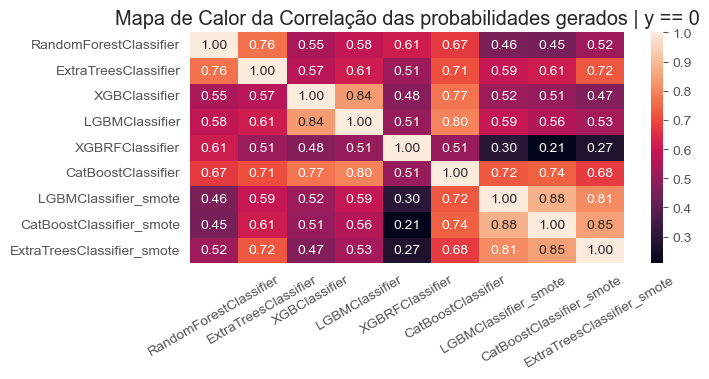

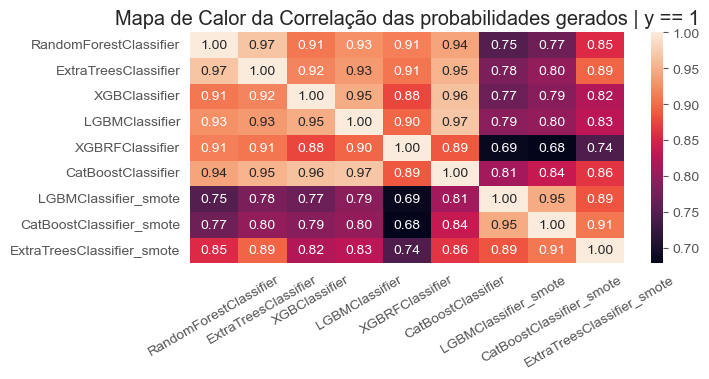

In [98]:
plt.figure(figsize=(7, 3))
sns.heatmap(correlacao_modelos_y0, annot=True, fmt=".2f")#, cmap='plasma')
plt.xticks(rotation=30)
plt.title('Mapa de Calor da Correlação das probabilidades gerados | y == 0')
plt.show()
####################################################################################
plt.figure(figsize=(7, 3))
sns.heatmap(correlacao_modelos_y1, annot=True, fmt=".2f")#, cmap='plasma')
plt.xticks(rotation=30)
plt.title('Mapa de Calor da Correlação das probabilidades gerados | y == 1')
plt.show()

# ================================================================

# Analise F-Beta das Diferenças

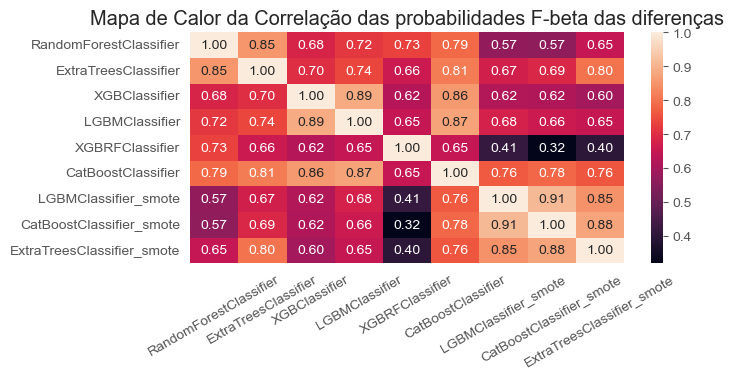

In [99]:
beta = 1#.5

delta_y1 = (1 - correlacao_modelos_y1)
#display(delta_y1.round(2))
delta_y0 = (1 - correlacao_modelos_y0)
#display(delta_y0.round(2))

# F-beta Score
denom_fb_score = (beta**2 * correlacao_modelos_y0) + correlacao_modelos_y1
escore_beta = (1 + beta**2) * (correlacao_modelos_y0 * correlacao_modelos_y1) / denom_fb_score
#############################################################################################

plt.figure(figsize=(7, 3))
sns.heatmap(escore_beta, annot=True, fmt=".2f")#, cmap='plasma')
plt.xticks(rotation=30)
plt.title('Mapa de Calor da Correlação das probabilidades F-beta das diferenças')
plt.show()

# ================================================================

# Analisando combinações de thresholds

In [100]:
from itertools import combinations

# Gerando todas as combinações de 3 itens
combinacoes_modelos = list(combinations(lista_modelos, 3))

In [101]:
len(combinacoes_modelos)

84

In [102]:
grade_thresholds = pd.DataFrame()

for i in range(len(combinacoes_modelos)):
    print('combinacao n:', i)

    lista = list(combinacoes_modelos[i])
    nome_combinacao = "\n".join(lista)

    modelos_escolhidos = lista
    modelos_escolhidos.append('y')

    fd_previsoes = previsoes[modelos_escolhidos]

    grade_thresholds_temp = gridsearch_mult_models_threshold(fd_previsoes, beta=1.5, linspace_thresholds = np.arange(0, 100, 10))
    grade_thresholds_temp['nome_comp'] = nome_combinacao
    grade_thresholds_temp['m1'] = lista[0]
    grade_thresholds_temp['m2'] = lista[1]
    grade_thresholds_temp['m3'] = lista[2]

    grade_thresholds = pd.concat([grade_thresholds, grade_thresholds_temp])

grade_thresholds = grade_thresholds.round(2)
grade_thresholds_bck = grade_thresholds
print('finish')

combinacao n: 0
combinacao n: 1
combinacao n: 2
combinacao n: 3
combinacao n: 4
combinacao n: 5
combinacao n: 6
combinacao n: 7
combinacao n: 8
combinacao n: 9
combinacao n: 10
combinacao n: 11
combinacao n: 12
combinacao n: 13
combinacao n: 14
combinacao n: 15
combinacao n: 16
combinacao n: 17
combinacao n: 18
combinacao n: 19
combinacao n: 20
combinacao n: 21
combinacao n: 22
combinacao n: 23
combinacao n: 24
combinacao n: 25
combinacao n: 26
combinacao n: 27
combinacao n: 28
combinacao n: 29
combinacao n: 30
combinacao n: 31
combinacao n: 32
combinacao n: 33
combinacao n: 34
combinacao n: 35
combinacao n: 36
combinacao n: 37
combinacao n: 38
combinacao n: 39
combinacao n: 40
combinacao n: 41
combinacao n: 42
combinacao n: 43
combinacao n: 44
combinacao n: 45
combinacao n: 46
combinacao n: 47
combinacao n: 48
combinacao n: 49
combinacao n: 50
combinacao n: 51
combinacao n: 52
combinacao n: 53
combinacao n: 54
combinacao n: 55
combinacao n: 56
combinacao n: 57
combinacao n: 58
combina

In [103]:
grade_thresholds.shape

(84000, 26)

colunas = ['precisao', 'sensibilidade', 'f1', 'fb_score']
fig = px.box(grade_thresholds, y=colunas, color = 'nome_comp')
fig.show()

In [104]:
colunas_uteis = [#'nome_comp', 
                 'threshold', 
                 'tn', 'fp', 'fn', 'tp', 
                 'precisao', 'sensibilidade', 
                 'f1', 'fb_score',
                 0, 1, 2,
                 'm1','m2','m3'
                 ]
grade_thresholds = grade_thresholds[colunas_uteis]
grade_thresholds = grade_thresholds.sort_values('fb_score', ascending=False)
# grade_thresholds = grade_thresholds.head(30)
grade_thresholds = grade_thresholds.reset_index()

custo_fp = 3.3
custo_fn = 10.0
grade_thresholds['custo_total'] = fd['fp']*custo_fp + fd['fn']*custo_fn

grade_thresholds.head(30)

,index,threshold,tn,fp,fn,tp,precisao,sensibilidade,f1,fb_score,0,1,2,m1,m2,m3,custo_total
0,216,"(20, 10, 60)",1659,78,50,50,0.39,0.50,0.44,0.46,20,10,60,RandomForestClassifier,ExtraTreesClassifier,CatBoostClassifier_smote,5732.1
1,125,"(10, 20, 50)",1660,77,52,48,0.38,0.48,0.43,0.45,10,20,50,RandomForestClassifier,ExtraTreesClassifier,LGBMClassifier_smote,1024.1
2,311,"(30, 10, 10)",1693,44,57,43,0.49,0.43,0.46,0.45,30,10,10,RandomForestClassifier,ExtraTreesClassifier,LGBMClassifier,1024.1
3,115,"(10, 10, 50)",1661,76,52,48,0.39,0.48,0.43,0.45,10,10,50,RandomForestClassifier,XGBClassifier,LGBMClassifier_smote,1024.1
4,217,"(20, 10, 70)",1679,58,54,46,0.44,0.46,0.45,0.45,20,10,70,RandomForestClassifier,ExtraTreesClassifier,LGBMClassifier_smote,1024.1
5,114,"(10, 10, 40)",1610,127,44,56,0.31,0.56,0.40,0.45,10,10,40,ExtraTreesClassifier,XGBRFClassifier,CatBoostClassifier_smote,1024.1
6,115,"(10, 10, 50)",1628,109,47,53,0.33,0.53,0.40,0.45,10,10,50,ExtraTreesClassifier,XGBRFClassifier,CatBoostClassifier_smote,1024.1
7,211,"(20, 10, 10)",1700,37,58,42,0.53,0.42,0.47,0.45,20,10,10,RandomForestClassifier,XGBClassifier,XGBRFClassifier,1024.1
8,221,"(20, 20, 10)",1698,39,58,42,0.52,0.42,0.46,0.45,20,20,10,RandomForestClassifier,ExtraTreesClassifier,CatBoostClassifier,1024.1
9,223,"(20, 20, 30)",1691,46,57,43,0.48,0.43,0.46,0.45,20,20,30,RandomForestClassifier,ExtraTreesClassifier,LGBMClassifier_smote,1024.1


In [105]:
fig = px.scatter(fd, x='fb_score', y='custo_total', color='tipo', symbol='threshold',
                 hover_data=['precisao', 'sensibilidade', 'modelo'])
fig.show()

In [106]:
custo_fp = 3.3
custo_fn = 10.0
grade_thresholds_bck['custo_total'] = grade_thresholds_bck['fp']*custo_fp + grade_thresholds_bck['fn']*custo_fn

fig = px.scatter(grade_thresholds_bck, x='fb_score', y='custo_total',
                 hover_data=['precisao', 'sensibilidade', 
                             0,1,2])
fig.show()

In [107]:
stop

NameError: name 'stop' is not defined

# avaliando como o modelo trabalha

In [ ]:
#for linha in range(len(grade_thresholds)):
linha = grade_thresholds.index[1]
m1, m2, m3 = grade_thresholds['m1'][linha], grade_thresholds['m2'][linha], grade_thresholds['m3'][linha]
############print(m1, m2, m3)

####################################################################################
corte1, corte2, corte3 = grade_thresholds[0][linha], grade_thresholds[1][linha], grade_thresholds[2][linha]
############print(corte1, corte2, corte3)

####################################################################################
previsoes_filter0 = previsoes[['y', m1, m2, m3]]
previsoes_filter = previsoes_filter0
############previsoes_filter.sample(5)

####################################################################################
previsoes_filter['m1_bin'] = np.where(previsoes_filter[m1] > corte1, 1, 0)
previsoes_filter['m2_bin'] = np.where(previsoes_filter[m2] > corte2, 1, 0)
previsoes_filter['m3_bin'] = np.where(previsoes_filter[m3] > corte3, 1, 0)

previsoes_filter['decisao_final'] = previsoes_filter['m1_bin'] + previsoes_filter['m2_bin'] + previsoes_filter['m3_bin']
previsoes_filter['decisao_final'] = np.where(previsoes_filter['decisao_final'] >= 2, 1, 0)
############previsoes_filter.sample(5)

####################################################################################
colunas_avaliadas = ['m1_bin','m2_bin','m3_bin','decisao_final','y']
previsoes_filter = previsoes_filter#[previsoes_filter['y'] == 1].reset_index(drop=True)
fig = px.parallel_categories(previsoes_filter[colunas_avaliadas], 
                            color='decisao_final', 
                            color_continuous_scale=px.colors.diverging.Tealrose,
                            color_continuous_midpoint=0.5)
fig.update_layout(title=grade_thresholds['nome_comp'][linha])
fig.show()

####################################################################################
import plotly.express as px
import plotly.graph_objects as go

fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = previsoes_filter0['y'],
                   colorscale = [[0,'grey'], [1,'red']]),
        dimensions = list([
            dict(range = [0, 100],
                label = m1, values = previsoes_filter0[m1]),
            dict(range = [0, 100],
                label = m2, values = previsoes_filter0[m2]),
            dict(range = [0, 100],
                label = m3, values = previsoes_filter0[m3]),
            dict(range = [0, 1],
                #constraintrange = [0.5,1],
                label = 'y', values = previsoes_filter0['y'])
        ])
    )
)
fig.show()
####################################################################################


In [ ]:
print(corte1, corte2, corte3)

# Criando Pós Roc

In [ ]:
print(m1, m2, m3)

In [ ]:
modelo_m1 = model_dict['LGBMClassifier']
coluna_analisada = 'remainder__' + 'feature_4'

x_data = pd.DataFrame(x_teste.values, columns=novos_nomes_colunas, index=x_teste.index)

contribuicao_proba2(x_data, modelo_m1)

plt.figure(figsize=(10, 33))
contribuicao_proba(x_data, modelo_m1, sep=100)